In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as pe
plt.rcParams['figure.figsize'] = (8, 5)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline
import warnings
warnings.filterwarnings(action= 'ignore')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/PrathameshR10/Assignments/main/Folder/wine.csv')

In [3]:
df

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [4]:
df['Type'].value_counts()

2    71
1    59
3    48
Name: Type, dtype: int64

<Axes: xlabel='Type', ylabel='count'>

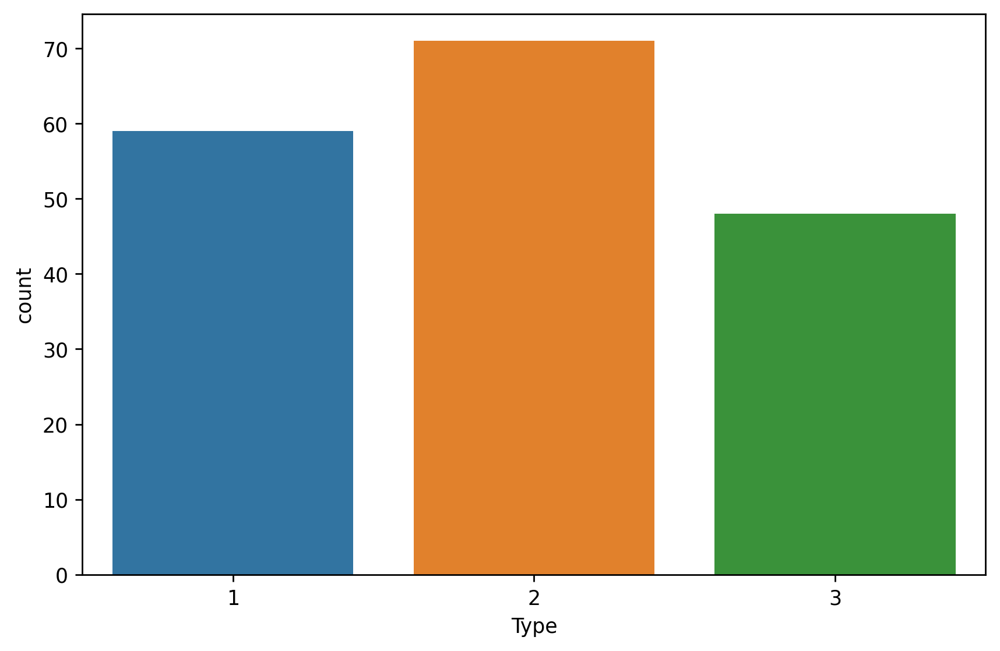

In [5]:
sns.countplot(x = 'Type',data=df)

### Duplicates & Missing Values

In [6]:
df.duplicated().sum()

0

In [7]:
df.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [9]:
pe.box(df)

In [10]:
pe.box(df[['Magnesium','Alcalinity','Ash','Malic','Color','Hue','Proanthocyanins']])

### Capping for Outliers

In [11]:
def outlier_capping(data, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 -Q1
    
    lower_cap = Q1 - 1.5 * IQR
    upper_cap = Q3 + 1.5 * IQR
    
    df[columns] = df[columns].clip(lower=lower_cap, upper=upper_cap, axis = 1)
    return df

cap_columns = ['Magnesium','Alcalinity','Ash','Malic','Color','Hue','Proanthocyanins']
cap_df = outlier_capping(df, cap_columns)

In [12]:
pe.box(df)

In [13]:
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.330435,2.366721,19.478090,99.483146,2.295112,2.029270,0.361854,1.586067,5.038146,0.956979,2.611685,746.893258
std,0.775035,0.811827,1.100173,0.263705,3.287757,13.414186,0.625851,0.998859,0.124453,0.558153,2.260881,0.227095,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.688750,10.750000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.302500,3.078750,27.950000,135.500000,3.880000,5.080000,0.660000,3.000000,10.670000,1.626250,4.000000,1680.000000


<Axes: >

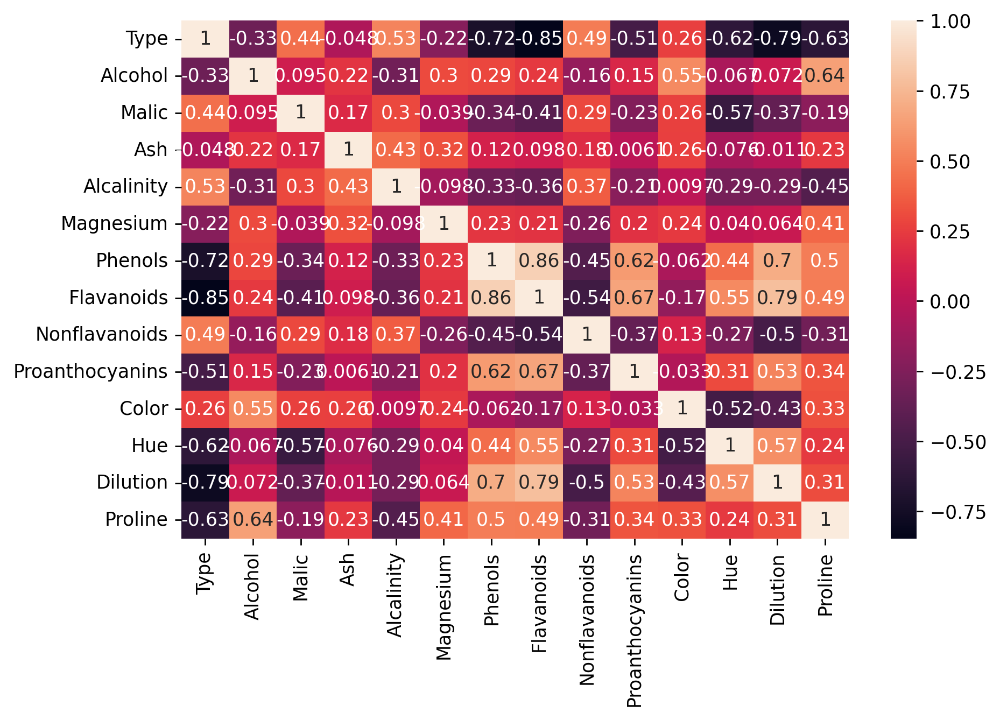

In [14]:
sns.heatmap(df.corr(),annot=True)

In [15]:
sns.pairplot(df.drop(columns='Type'))

### Encoding Categorical Variables

In [16]:
x = pd.get_dummies(df, columns=['Type'],drop_first=True)

### Standardizing Data

In [17]:
from sklearn.preprocessing import StandardScaler

In [18]:
sc = StandardScaler()

In [19]:
dfs = sc.fit_transform(x)

In [20]:
dfs = pd.DataFrame(dfs, columns=x.columns)
dfs

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Type_2,Type_3
0,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009,-0.814587,-0.607644
1,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242,-0.814587,-0.607644
2,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148,-0.814587,-0.607644
3,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574,-0.814587,-0.607644
4,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874,-0.814587,-0.607644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876275,2.709072,0.316696,0.311700,-0.335152,-0.985614,-1.424900,1.274310,-0.945173,1.180674,-1.399735,-1.231206,-0.021952,-0.814587,1.645701
174,0.493343,1.439792,0.430781,1.074241,0.188156,-0.793334,-1.284344,0.549108,-0.316336,1.003253,-1.134784,-1.485445,0.009893,-0.814587,1.645701
175,0.332758,1.777051,-0.405838,0.159191,1.533804,-1.129824,-1.344582,0.549108,-0.424137,2.289557,-1.620528,-1.485445,0.280575,-0.814587,1.645701
176,0.209232,0.236596,0.012471,0.159191,1.533804,-1.033684,-1.354622,1.354888,-0.226502,1.890359,-1.576370,-1.400699,0.296498,-0.814587,1.645701


## Model Building without PCA

### Hierarchical Clustering

In [21]:
from scipy.cluster import hierarchy

#### 1.Single Linkage Method

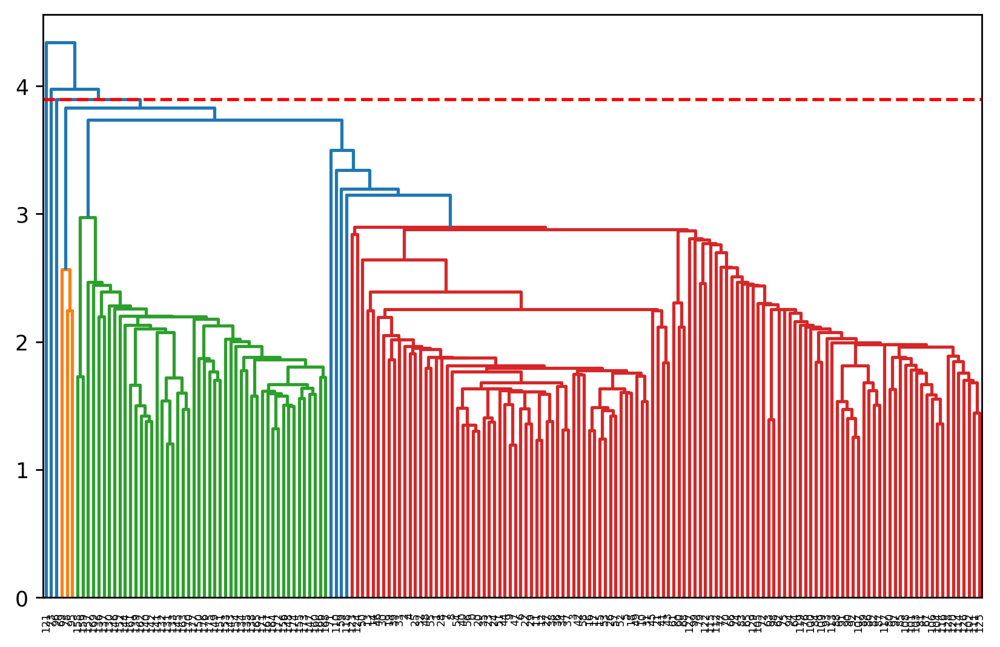

In [22]:
lk = hierarchy.linkage(dfs, method='single')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 3.9, linestyle = '--', color = 'red')

#### 2.Complete Linkage Method

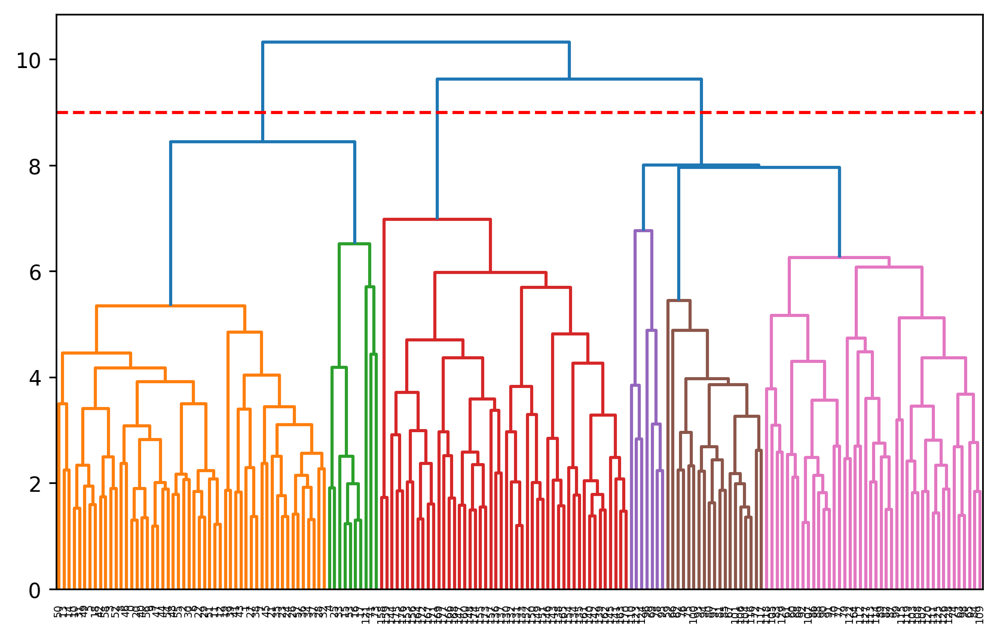

In [23]:
lk1 = hierarchy.linkage(dfs, method='complete')
dendrogram1 = hierarchy.dendrogram(lk1)
plt.axhline(y = 9, linestyle = '--', color = 'red')

In [24]:
from sklearn.cluster import AgglomerativeClustering

In [25]:
hc = AgglomerativeClustering(n_clusters=3)
y_pred = hc.fit_predict(dfs)
y_pred

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [26]:
dfs['Cluster'] = y_pred
dfs

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Type_2,Type_3,Cluster
0,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009,-0.814587,-0.607644,2
1,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242,-0.814587,-0.607644,2
2,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148,-0.814587,-0.607644,2
3,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574,-0.814587,-0.607644,2
4,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874,-0.814587,-0.607644,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876275,2.709072,0.316696,0.311700,-0.335152,-0.985614,-1.424900,1.274310,-0.945173,1.180674,-1.399735,-1.231206,-0.021952,-0.814587,1.645701,1
174,0.493343,1.439792,0.430781,1.074241,0.188156,-0.793334,-1.284344,0.549108,-0.316336,1.003253,-1.134784,-1.485445,0.009893,-0.814587,1.645701,1
175,0.332758,1.777051,-0.405838,0.159191,1.533804,-1.129824,-1.344582,0.549108,-0.424137,2.289557,-1.620528,-1.485445,0.280575,-0.814587,1.645701,1
176,0.209232,0.236596,0.012471,0.159191,1.533804,-1.033684,-1.354622,1.354888,-0.226502,1.890359,-1.576370,-1.400699,0.296498,-0.814587,1.645701,1


In [27]:
dfs.groupby(dfs['Cluster']).agg('mean')

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Type_2,Type_3
Cluster,,,,,,,,,,,,,,,
0,-0.920309,-0.361617,-0.544040,0.127793,-0.481920,-0.120591,-0.015950,0.038385,0.035337,-0.888241,0.405070,0.203878,-0.738228,1.227616,-0.607644
1,0.189159,0.903994,0.267577,0.591298,-0.012757,-0.987617,-1.252761,0.690119,-0.777109,1.013140,-1.211141,-1.310950,-0.372578,-0.814587,1.645701
2,0.862926,-0.303254,0.389532,-0.597939,0.538434,0.896867,0.987373,-0.576386,0.562876,0.189833,0.493388,0.791321,1.098117,-0.715770,-0.607644


<Axes: xlabel='Alcohol', ylabel='Malic'>

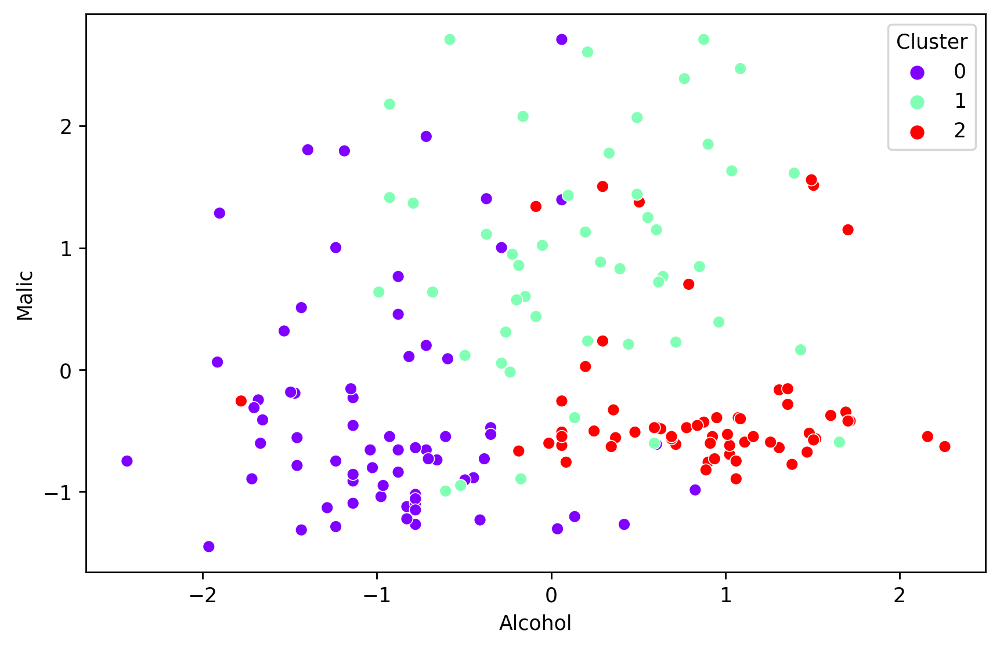

In [28]:
sns.scatterplot(x = dfs['Alcohol'],y = dfs['Malic'], hue=dfs['Cluster'],palette='rainbow')

### K-Means

In [29]:
from sklearn.cluster import KMeans

In [30]:
km = KMeans()

In [31]:
y_pred = km.fit_predict(dfs)

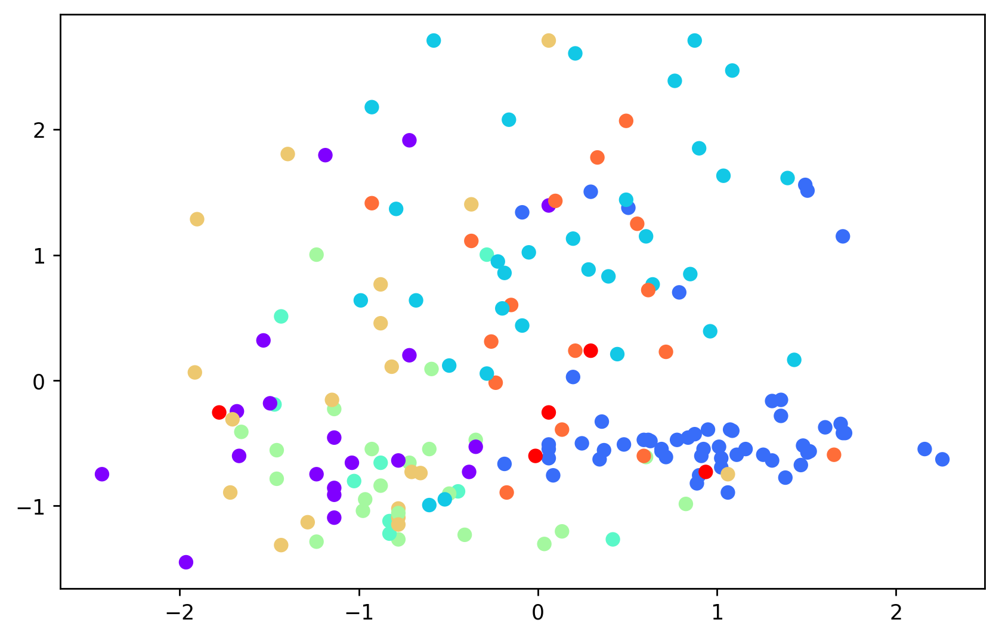

In [32]:
plt.scatter(x = dfs['Alcohol'],y = dfs['Malic'],c= y_pred,cmap='rainbow')

In [33]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(dfs)
    wcss.append(km.inertia_)

Text(0.5, 1.0, 'Elbow Graph')

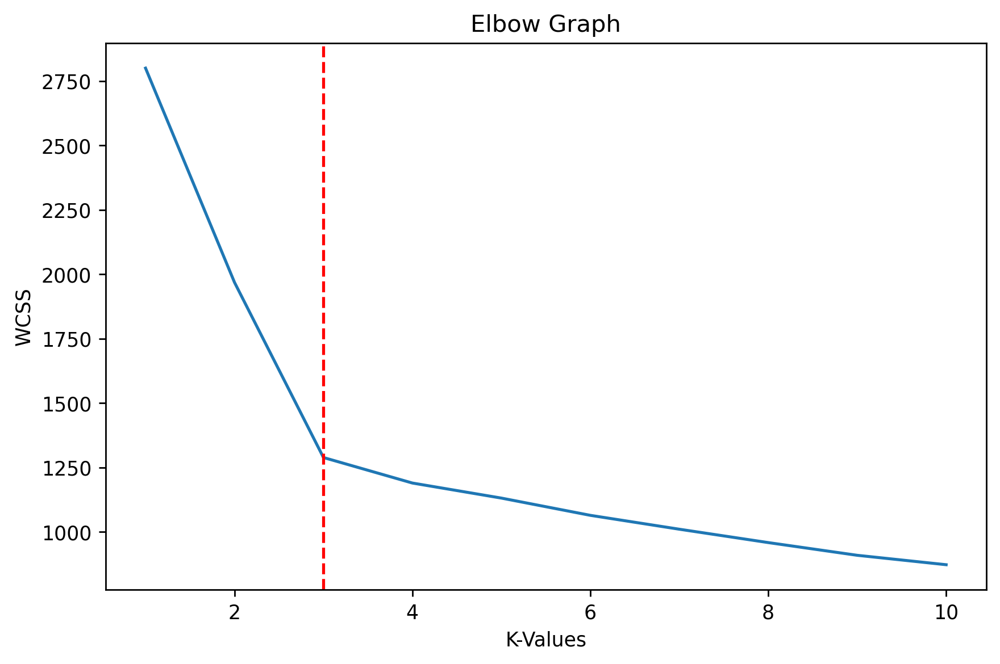

In [34]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 3, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [35]:
km1 = KMeans(n_clusters=3)

In [36]:
ypred1 = km1.fit_predict(dfs)

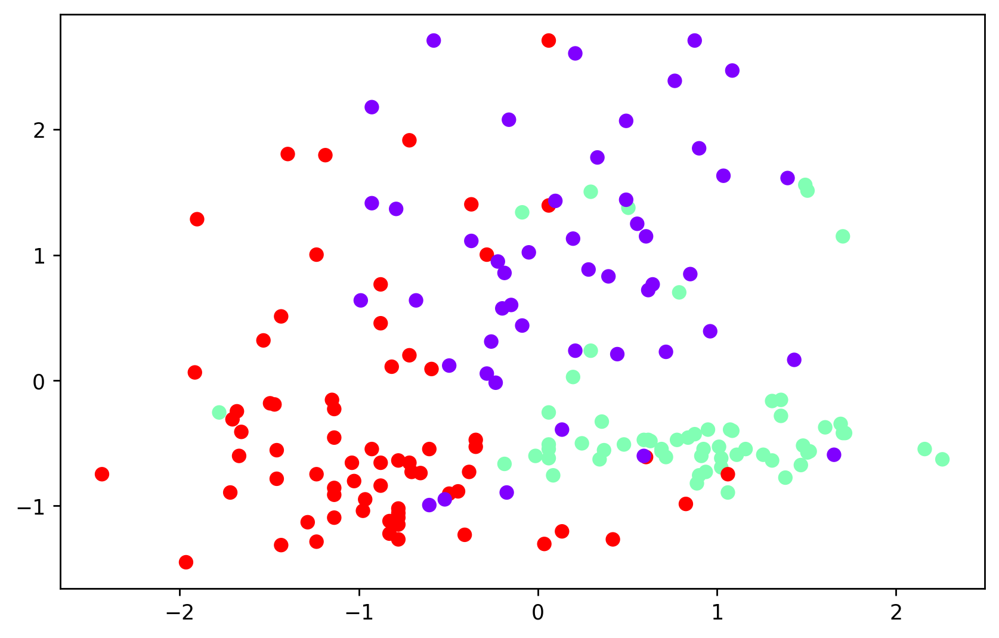

In [37]:
plt.scatter(x = dfs['Alcohol'],y = dfs['Malic'],c= ypred1,cmap='rainbow')

In [38]:
# The data points are somewhat spread out with no clear clusters. 
# This indicates that while there may be some relationship between alcohol and malic acid, 
    # it's not strong enough to clearly distinguish different wine types.

In [39]:
from sklearn.metrics import silhouette_score

In [40]:
silhouette_score(dfs, ypred1)

0.3802133699190822

## Model Building using PCA

In [41]:
from sklearn.decomposition import PCA

In [42]:
pca = PCA()

In [43]:
pcs = pca.fit_transform(dfs)

In [44]:
pca.explained_variance_ratio_

array([0.35072969, 0.25787854, 0.09166467, 0.05902973, 0.05352649,
       0.04279775, 0.03412591, 0.02279696, 0.01958038, 0.01654396,
       0.01461723, 0.01321854, 0.01094917, 0.00808192, 0.00305543,
       0.00140364])

In [45]:
# Insights:

# Variance Explained by Each Principal Component
# First Component (0.36200213): Explains approximately 36.2% of the total variance.
# Second Component (0.23535819): Explains approximately 23.5% of the total variance.
# Third Component (0.09610505): Explains approximately 9.6% of the total variance.
# Fourth Component (0.06151676): Explains approximately 6.2% of the total variance.
# Remaining components explain progressively less variance.

In [46]:
np.cumsum(pca.explained_variance_ratio_)

array([0.35072969, 0.60860823, 0.7002729 , 0.75930263, 0.81282912,
       0.85562687, 0.88975278, 0.91254974, 0.93213012, 0.94867408,
       0.96329131, 0.97650984, 0.98745901, 0.99554093, 0.99859636,
       1.        ])

In [47]:
# Insights:

# First Component: 36.2%
# First + Second Components: 36.2% + 23.5% = 59.7%
# First + Second + Third Components: 59.7% + 9.6% = 69.3%
# First + Second + Third + Fourth Components: 69.3% + 6.2% = 75.5%

Text(0.5, 1.0, 'Scree Plot')

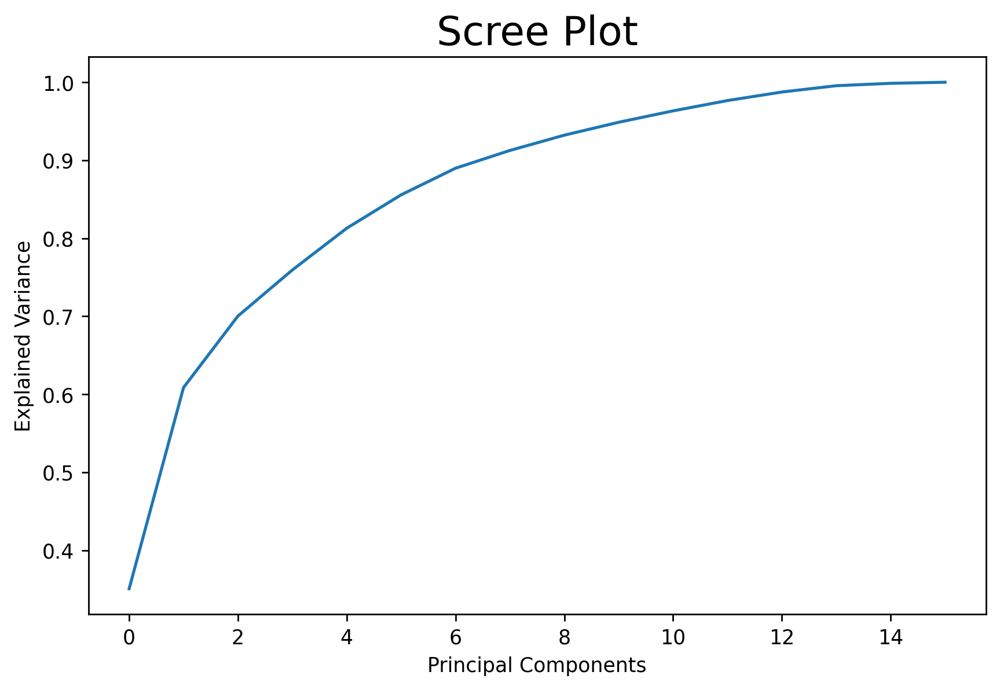

In [48]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.title('Scree Plot', size = 20)

In [49]:
pca = PCA(n_components=2)
pcs = pca.fit_transform(dfs)
pcs

array([[-3.36713896e+00, -2.05413585e+00],
       [-2.41451367e+00, -6.76579462e-01],
       [-2.64187341e+00, -1.56621668e+00],
       [-3.68587021e+00, -3.08180434e+00],
       [-1.26268303e+00, -1.32230971e+00],
       [-3.07934013e+00, -2.56666540e+00],
       [-2.57267134e+00, -1.80521621e+00],
       [-2.19288732e+00, -2.11861721e+00],
       [-2.63495308e+00, -1.61164500e+00],
       [-2.85027946e+00, -1.50434618e+00],
       [-3.51152854e+00, -1.94031677e+00],
       [-1.94906262e+00, -1.32405706e+00],
       [-2.27836071e+00, -1.37296166e+00],
       [-3.52683259e+00, -1.80584644e+00],
       [-4.25329528e+00, -2.64434427e+00],
       [-2.41189202e+00, -2.16059777e+00],
       [-2.26104691e+00, -2.60171727e+00],
       [-2.04138829e+00, -2.02855024e+00],
       [-3.50956280e+00, -2.91638920e+00],
       [-2.22793976e+00, -1.67662168e+00],
       [-3.21082256e+00, -1.52381042e+00],
       [-1.35008372e+00, -8.85314249e-01],
       [-2.71270788e+00, -8.05088138e-01],
       [-1.

In [50]:
data = pd.DataFrame(pcs,columns=['PC1','PC2'])
data

,PC1,PC2
0,-3.367139,-2.054136
1,-2.414514,-0.676579
2,-2.641873,-1.566217
3,-3.685870,-3.081804
4,-1.262683,-1.322310
...,...,...
173,3.755083,-2.197120
174,3.099217,-1.909753
175,3.227043,-2.748862
176,2.919185,-2.388322


<Axes: xlabel='PC1', ylabel='PC2'>

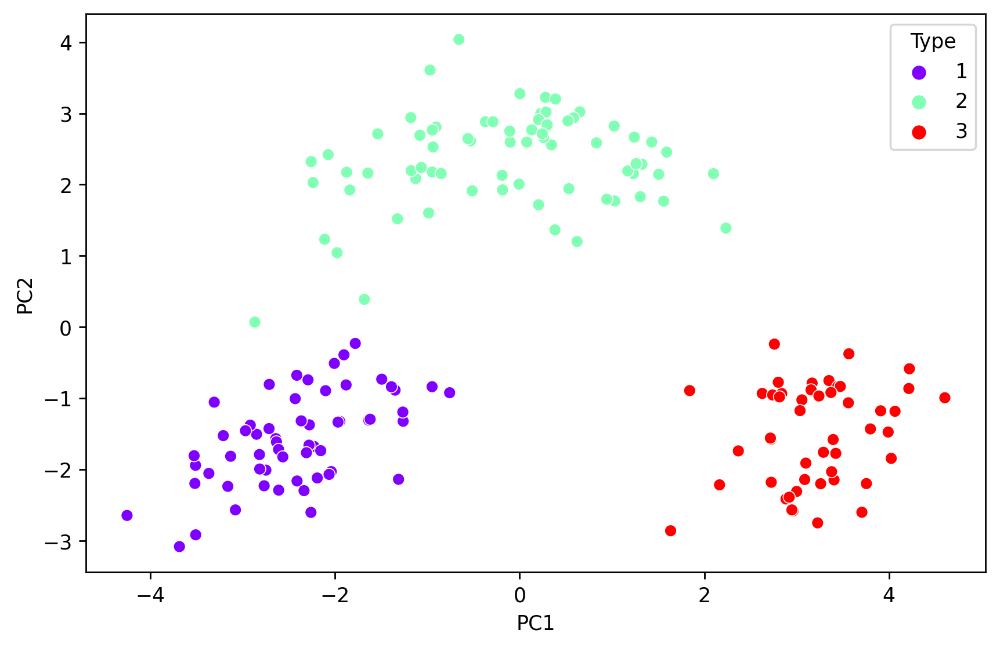

In [51]:
sns.scatterplot(x = data['PC1'], y = data['PC2'], hue=df['Type'],palette='rainbow')

In [52]:
#  There are distinct clusters visible in this plot, with each color representing a different wine type. 
# This indicates that PCA has effectively reduced the dimensionality while capturing the variance 
    # in a way that highlights the differences between wine types.

# Together, PC1 and PC2 capture 59% of the total variance in the dataset. 
# This means that over half of the variability in the wine dataset can be explained by the variations in alcohol and malic acid
    # content, along with their combined effects with other variables.

In [53]:
km2 = KMeans()
ypred2 = km2.fit_predict(data)

In [54]:
silhouette_score(data,ypred2)

0.41830754109454693

In [55]:
# Impact of Dimensionality Reduction on Clustering Performance
    # Improved Cluster Separation:
    
        # Dimensionality Reduction: By reducing the dataset to the most significant principal components,
            # PCA highlights the variance that contributes most to the differences between the wine types.
    
        # Clustering Performance: This transformation results in better-defined clusters,
            # improving the performance of clustering algorithms. 
    
        # In the PCA-transformed space, the clusters are more compact and separated.
        
    # Noise Reduction:
        # PCA: It reduces noise by ignoring less significant components that contribute little to the variance. 
        
        # This helps in focusing on the most relevant features for clustering.
        

### Pros and Cons of PCA

In [56]:
# Advantages of Using PCA:

    # Improved Clarity: PCA-transformed data often provides clearer separation of clusters.
    # Reduced Dimensionality: PCA reduces the number of dimensions, making the data easier to visualize and interpret.
    # Noise Reduction: By focusing on the components that explain the most variance, 
        # PCA reduces the impact of noisy, less relevant features.

# Disadvantages of Using PCA:

    # Loss of Interpretability: The principal components are linear combinations of the original variables,
        # which can make them harder to interpret compared to the original variables.
    # Information Loss: If too many dimensions are reduced, 
        # some information might be lost, potentially affecting the clustering results.